# Detectron2 on Custom Objects

This code is based on the book Modern Computer vision with pytorch
@Dieo Herrera
KisuiTech
Monday Nov 21th

### Steps Covered in this Tutorial

In this notebook we are going to upload our custom dataset from roboflow.

In order to train our image segmentation, we need follow the next steps:

* Install Detectron2 dependencies
* Download custom Detectron2 object detection data
* Visualize Detectron2 training data
* Write our Detectron2 Training configuration
* Run Detectron2 training
* Evaluate Detectron2 performance
* Run Detectron2 inference on test images

# Install Detectron2 Dependencies

In [5]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
# To install pytorch with cuda and cudnn follow the official site of nvidia
# https://forums.developer.nvidia.com/t/pytorch-for-jetson/72048

# Before running the code be sure it is installed torch, torchvision, cython, pyyaml, and pycocotools

import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv must be installed

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-c6hyq4x2
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-c6hyq4x2
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
1.13.0+cu117 False
gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
Copyright (C) 2019 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [7]:
# install detectron2:
#!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu112/torch1.13.0/index.html
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu112/torch1.13.0/index.html




Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu112/torch1.13.0/index.html
ERROR: Could not find a version that satisfies the requirement detectron2 (from versions: none)
ERROR: No matching distribution found for detectron2


Bad pipe message: %s [b'\x03\xfaaK\xc9b\xa6\xfb\xd9\r\xca\xa1\x96+hV/\xce Y\x12\x04\xe2\xa4\xdc\xe8W\xc8\xd3TjG\xcbh\xe8\x02\x9a\xf2Y&\xa6z\xfc\xe2^\xfc\xdb\xce\x90E4\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.']
Bad pipe message: %s [b'\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08']
Bad pipe message: %s [b'\x08\x08\t\x08\n\x08']
Bad pipe message: %s [b'\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06']
Bad pipe message: %s [b'']
Bad pipe message: %s [b"p9R\xa1\xfe.\xfeC\xcf]\n\x14\xb7\x8b{\xd3\x9b\xff\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\xc0V\xc0R\xc0$\xc0(\x00k\x00j\xc0#\xc0'\x00g\x00@\xc0\n\xc0\x14\x009\x008\xc0\t\xc0\x13\x003\x002\x00\x9d\xc0\xa1\xc0\x9d\xc0Q\x

# Download the dataset

In [ ]:
# Downloading the dataset from robolfow
!curl -L "https://app.roboflow.com/ds/nm93c2EWOc?key=CYKQgZJ26X" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

# Import Libraries

In [2]:
# Setting detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.data.datasets import register_coco_instances
import random
from detectron2.utils.visualizer import Visualizer

In [5]:
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


[11/21 14:26:58 d2.data.datasets.coco]: Loaded 97 images in COCO format from /content/train/_annotations.coco.json


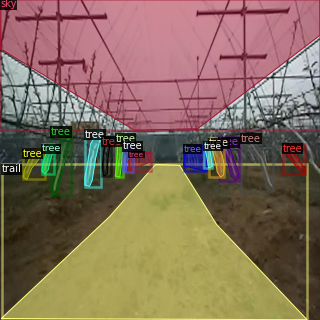

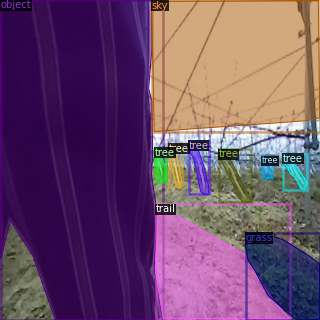

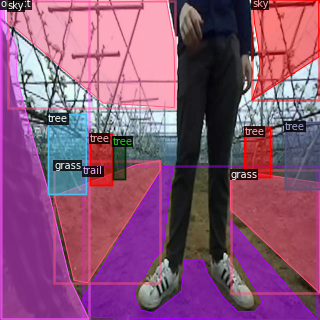

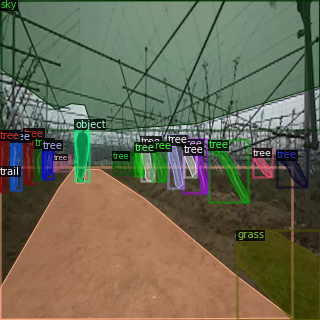

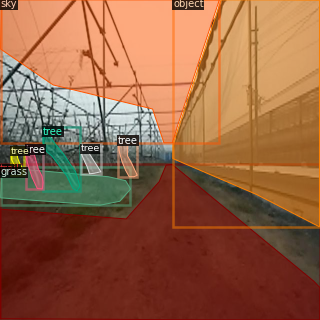

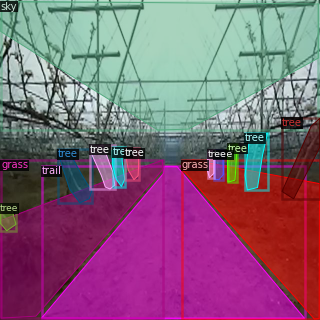

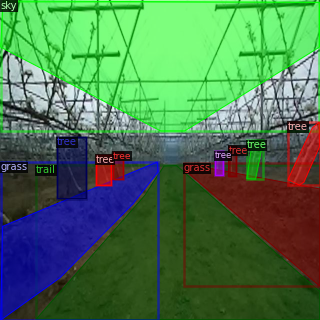

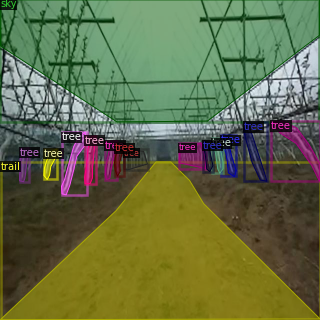

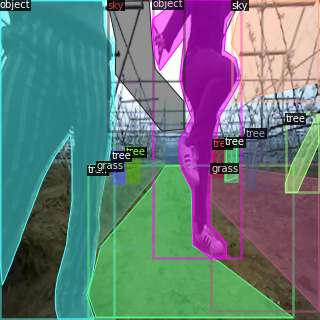

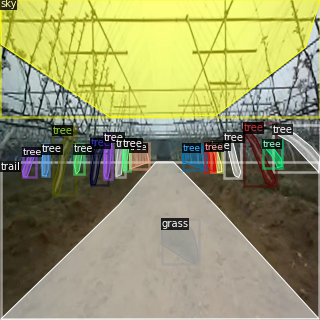

In [6]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [8]:
from .detectron2.tools.train_net import Trainer
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.00025


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 5000 
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05


cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[11/21 14:34:33 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:17, 9.98MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[11/21 14:34:54 d2.engine.train_loop]: Starting training from iteration 0
[11/21 14:35:08 d2.utils.events]:  eta: 0:57:13  iter: 19  total_loss: 5.617  loss_cls: 1.908  loss_box_reg: 0.803  loss_mask: 0.693  loss_rpn_cls: 1.982  loss_rpn_loc: 0.194  time: 0.6845  data_time: 0.0373  lr: 0.000005  max_mem: 3196M
[11/21 14:35:22 d2.utils.events]:  eta: 0:55:46  iter: 39  total_loss: 4.813  loss_cls: 1.760  loss_box_reg: 0.831  loss_mask: 0.692  loss_rpn_cls: 1.274  loss_rpn_loc: 0.166  time: 0.6743  data_time: 0.0165  lr: 0.000010  max_mem: 3196M
[11/21 14:35:35 d2.utils.events]:  eta: 0:55:50  iter: 59  total_loss: 3.817  loss_cls: 1.563  loss_box_reg: 0.848  loss_mask: 0.691  loss_rpn_cls: 0.523  loss_rpn_loc: 0.150  time: 0.6757  data_time: 0.0169  lr: 0.000015  max_mem: 3196M
[11/21 14:35:49 d2.utils.events]:  eta: 0:56:09  iter: 79  total_loss: 3.328  loss_cls: 1.335  loss_box_reg: 0.865  loss_mask: 0.687  loss_rpn_cls: 0.306  loss_rpn_loc: 0.148  time: 0.6791  data_time: 0.0137  lr:

In [9]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

# Inference with Detectron2 Saved Weights



In [11]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.50   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_train")

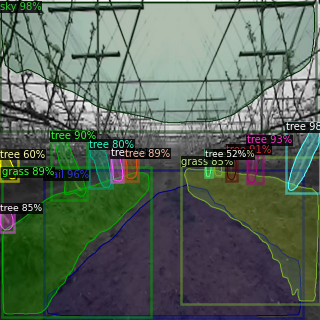

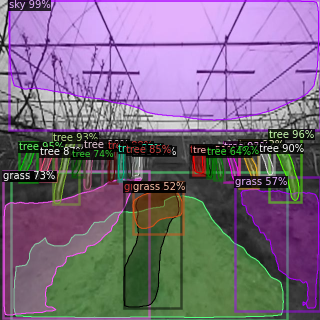

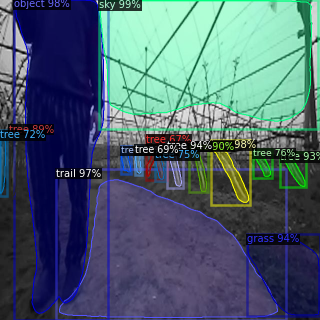

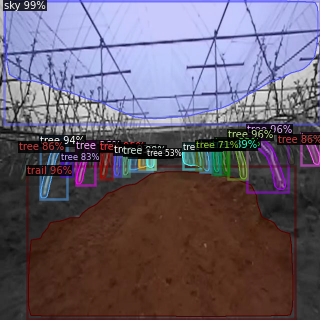

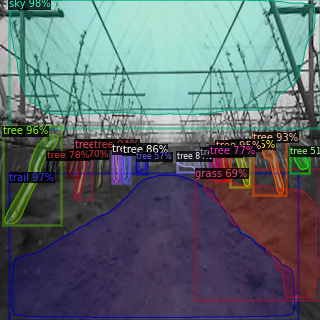

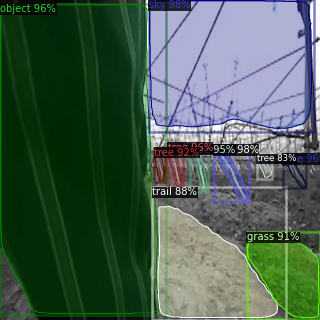

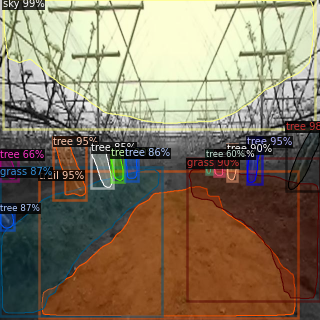

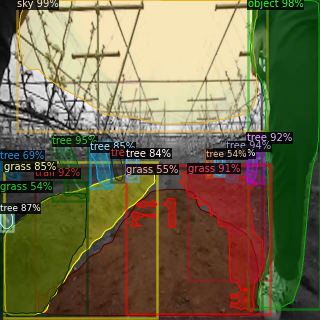

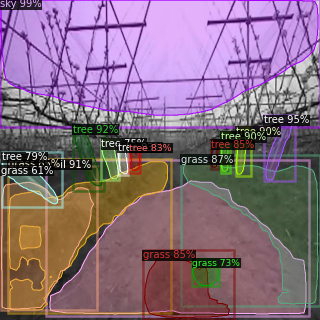

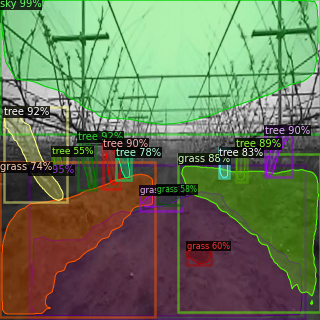

In [12]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.5,
                 instance_mode=ColorMode.IMAGE_BW #SEGMENTATION = 1
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
